In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import numpy as np
import random
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.image import imsave
from latex import latexify, format_axes
try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

from sklearn import preprocessing
import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
%config InlineBackend.figure_format = "retina"

if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

print(device)

cuda


In [ ]:
!sudo apt install cm-super dvipng texlive-latex-extra texlive-latex-recommended

In [4]:
def save_reconstructed_image(outputs, save_path):
  outputs = outputs.cpu().numpy().clip(0, 1)
  outputs = (outputs * 255).astype(np.uint8)
  pil_image = Image.fromarray(outputs)
  pil_image.save(save_path)

In [5]:
img = torchvision.io.read_image("dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


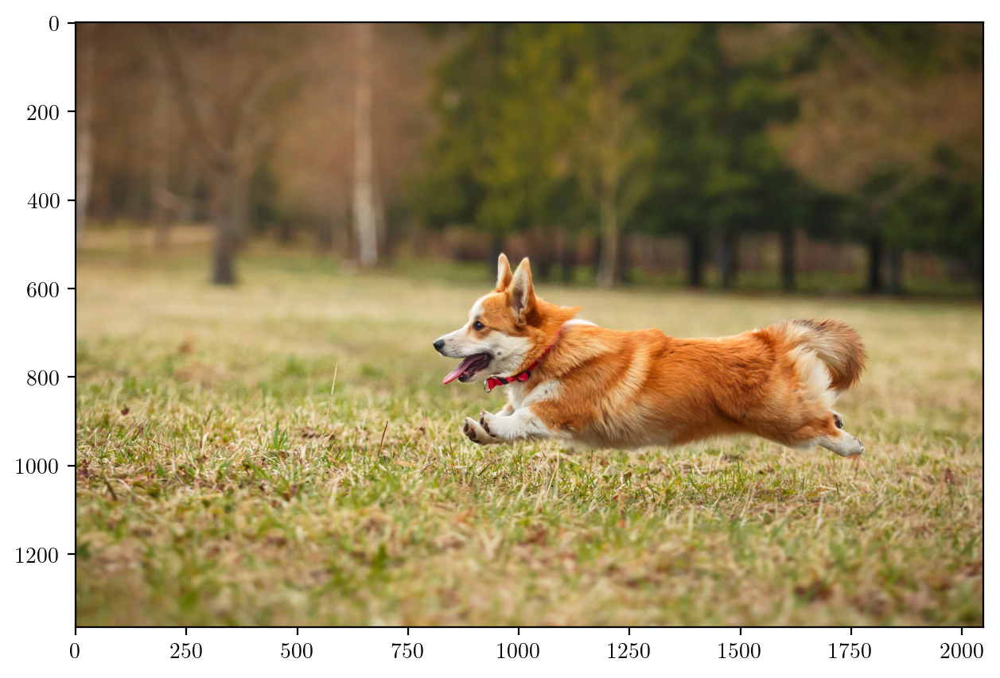

In [6]:
latexify(columns = 2, fig_width = 8)
plt.imshow(rearrange(img, "c h w -> h w c").numpy())
plt.show()

In [7]:
img = transforms.functional.crop(img.cpu(), 600, 800, 300, 300)
print(img.shape)

torch.Size([3, 300, 300])


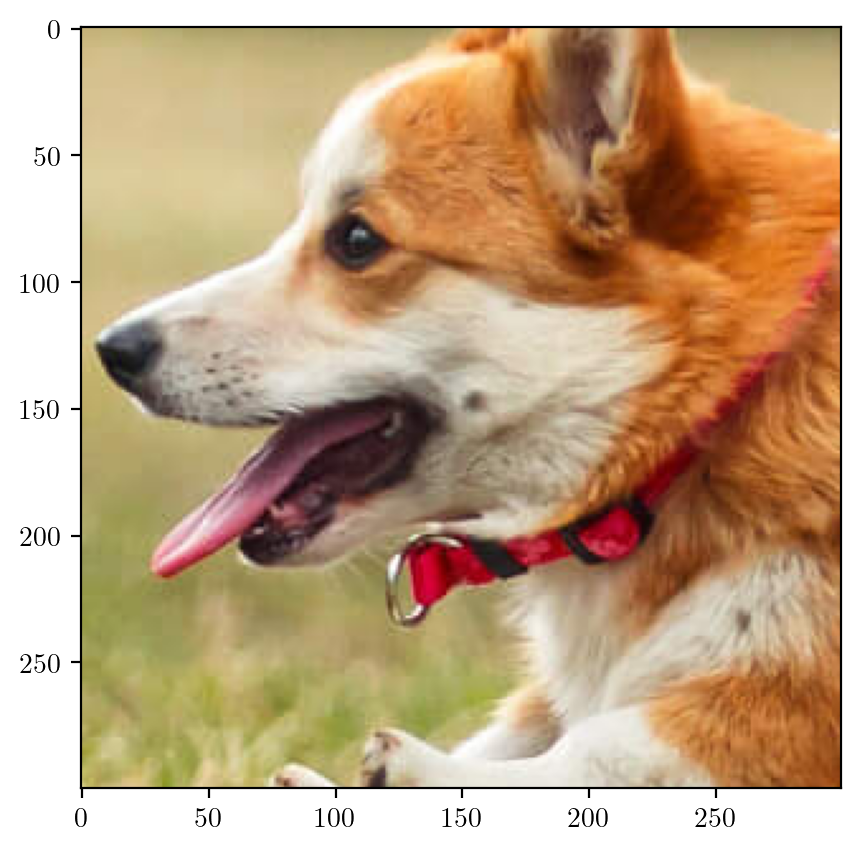

In [8]:
latexify(columns = 2, fig_width = 8)
plt.imshow(rearrange(img, "c h w -> h w c").numpy())
plt.show()

In [9]:
scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled.shape
img_scaled = torch.tensor(img_scaled)
img_scaled = img_scaled.to(device, dtype = torch.float32)
img_scaled

tensor([[[0.7686, 0.7686, 0.7686,  ..., 0.5451, 0.5451, 0.5412],
         [0.7725, 0.7725, 0.7725,  ..., 0.5686, 0.5686, 0.5647],
         [0.7765, 0.7765, 0.7765,  ..., 0.5882, 0.5843, 0.5843],
         ...,
         [0.7961, 0.7373, 0.7176,  ..., 0.5843, 0.5725, 0.5490],
         [0.8471, 0.7843, 0.7451,  ..., 0.6039, 0.5686, 0.5569],
         [0.8784, 0.8196, 0.7686,  ..., 0.6275, 0.5804, 0.5686]],

        [[0.6941, 0.6941, 0.6941,  ..., 0.5137, 0.5137, 0.5098],
         [0.6980, 0.6980, 0.6980,  ..., 0.5255, 0.5255, 0.5216],
         [0.7020, 0.7020, 0.7020,  ..., 0.5451, 0.5412, 0.5412],
         ...,
         [0.7686, 0.7098, 0.6863,  ..., 0.2824, 0.2706, 0.2431],
         [0.8157, 0.7569, 0.7137,  ..., 0.3059, 0.2667, 0.2431],
         [0.8431, 0.7882, 0.7333,  ..., 0.3294, 0.2706, 0.2588]],

        [[0.4745, 0.4745, 0.4745,  ..., 0.3294, 0.3294, 0.3255],
         [0.4784, 0.4784, 0.4784,  ..., 0.3451, 0.3451, 0.3412],
         [0.4824, 0.4824, 0.4824,  ..., 0.3647, 0.3608, 0.

### Function for removing Patch

In [10]:
def remove_patch(img, Corner, d, display = True):
    X, Y = Corner
    latexify(columns = 2, fig_width = 10)
    img_copy = img.clone()
    img_copy[:, X : X + d, Y : Y + d] = float("nan")
    crop = transforms.functional.crop(img.cpu(), X, Y, d, d)
    fig, ax = plt.subplots(nrows = 1, ncols = 2, gridspec_kw = {"width_ratios": [img.shape[2] / (5 * d), 1]})
    fig.suptitle(fr"Patch size = $({d} \times {d})$ removed", fontsize = 16)
    ax[0].imshow(rearrange(img_copy, 'c h w -> h w c').cpu().numpy())
    ax[0].set_title("Masked Image")
    ax[1].imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())
    ax[1].set_title("Masked Crop")
    if (display):
        plt.show()
    else:
        plt.close()
    return img_copy, crop

### Function for removing Subset

In [11]:
def remove_subset(img, d, display = True):
    latexify(columns = 2, fig_width = 8)
    img_copy = img.clone()
    height, width = img.shape[1], img.shape[2]
    random_h_coords = random.sample(range(height), d)
    random_w_coords = random.sample(range(width), d)
    img_copy[:, random_h_coords, random_w_coords] = float("nan")
    plt.title(fr"Random {d*d} points removed from image", fontsize = 16)
    plt.imshow(rearrange(img_copy, 'c h w -> h w c').cpu().numpy())
    if (display):
        plt.show()
    else:
        plt.close()
    return img_copy

#### $$ \text{PSNR} = 20 \log_{10}(\frac{\text{MAX}_I}{\sqrt{\text{MSE}}})$$

In [12]:
def metrics(img1, img2, max_value = 1.0):
  rmse = torch.sqrt(F.mse_loss(img1, img2))
  psnr_value = 20 * torch.log10(max_value / rmse)
  return rmse, psnr_value.item()

## Gradient Descent using Adam Optimizer $A_{N \times M} \approx W_{N \times k} H_{k \times M}$

In [14]:
def factorize(Img, k, convergence, device = torch.device("cpu")):
  """Factorize the matrix D into A and B"""
  Img = Img.to(device)
  losses, images = [], []
  for channel in range(Img.shape[0]):
      A = Img[channel]

      torch.manual_seed(42)
      W = torch.randn(A.shape[0], k, requires_grad = True, device = device)
      H = torch.randn(k, A.shape[1], requires_grad = True, device = device)

      optimizer = optim.Adam([W, H], lr = 0.02)
      mask = ~torch.isnan(A)
      prev_loss = float('inf')
      for i in range(10000):

          diff_matrix = torch.mm(W, H) - A
          diff_vector = diff_matrix[mask]
          loss = torch.norm(diff_vector)

          if torch.abs(prev_loss - loss) < convergence:
              break

          optimizer.zero_grad()

          loss.backward()

          optimizer.step()

          prev_loss = loss.item()

      losses.append(loss)
      images.append(torch.mm(W, H))

  return losses, torch.stack([images[0], images[1], images[2]], dim = 0), i

## Function for Training and Plotting the Reconstructed Image

In [15]:
def train_reconstruct_plot_patch(img, Corner, d, features, convergence, device, allowSave = False, FileName = None, allowMetrics = False):
  imgSingle, croppedSingle = remove_patch(img, Corner, d, display = False)
  losses, FinalImage, i = factorize(imgSingle, features, convergence, device)
  img_copy = FinalImage.clone()
  X, Y = Corner
  newCroppedSingle = img_copy[:, X : X + d, Y : Y + d]
  rmse, psnr = metrics(img, img_copy)
  latexify(columns = 2)
  fig, ax = plt.subplots(nrows = 1, ncols = 3, gridspec_kw = {"width_ratios": [img.shape[2] / (3 * d), 1, img.shape[2] / (3 * d)]}, figsize = (15, 8))
  fig.suptitle(f"RMSE : {rmse} | PNSR : {psnr}" "\n" fr"Crop Corner = $({X}, {Y})$" "\n" f"Features = {features}" "\n" fr"Loss Red = {losses[0]}, Loss Green = {losses[0]}, Loss Blue = {losses[2]}" "\n" f"Converged after {i} iteration", fontsize = 12)
  ax[0].imshow(rearrange(imgSingle, 'c h w -> h w c').cpu().numpy())
  ax[0].set_title("Masked Image" "\n" rf"$({img.shape[1]} \times {img.shape[2]})$")
  ax[1].imshow(rearrange(croppedSingle, 'c h w -> h w c').cpu().numpy())
  ax[1].set_title("Patch" "\n" fr"$({d} \times {d})$")
  ax[2].imshow(rearrange(FinalImage, 'c h w -> h w c').cpu().detach().numpy())
  ax[2].set_title("Reconstructed Image" "\n" rf"$({img.shape[1]} \times {img.shape[2]})$")
  if (allowSave):
      save_reconstructed_image(rearrange(FinalImage, 'c h w -> h w c').detach(), FileName)
  for i in range(3):
      ax[i].axis("off")
  plt.show()

  fig, ax = plt.subplots(nrows = 1, ncols = 2, gridspec_kw = {"width_ratios": [1, 1]}, figsize = (8, 4))
  fig.suptitle("Comparison of Original and Reconstructed Patch", fontsize = 12)
  ax[0].imshow(rearrange(croppedSingle, 'c h w -> h w c').cpu().numpy())
  ax[0].set_title("Original Patch")
  ax[0].axis("off")
  ax[1].imshow(rearrange(newCroppedSingle, 'c h w -> h w c').cpu().detach().numpy())
  ax[1].set_title("Reconstructed Patch")
  ax[1].axis("off")
  plt.show()

  if (allowMetrics):
      return rmse, psnr

In [16]:
def train_reconstruct_plot_subset(img, d, features, convergence, device, allowSave = False, FileName = None, allowMetrics = False):
  imgSingle = remove_subset(img, d, display = False)
  losses, FinalImage, i = factorize(imgSingle, features, convergence, device)
  img_copy = FinalImage.clone()
  rmse, psnr = metrics(img, img_copy)
  latexify(columns = 2)
  fig, ax = plt.subplots(nrows = 1, ncols = 2, gridspec_kw = {"width_ratios": [1, 1]}, figsize = (10, 6))
  fig.suptitle(f"RMSE : {rmse} | PNSR : {psnr}" "\n" f"Features = {features}" "\n" fr"Loss Red = {losses[0]}, Loss Green = {losses[0]}, Loss Blue = {losses[2]}" "\n" f"Converged after {i} iteration", fontsize = 12)
  ax[0].imshow(rearrange(imgSingle, 'c h w -> h w c').cpu().numpy())
  ax[0].set_title("Masked Image")
  ax[0].axis("off")
  ax[1].imshow(rearrange(FinalImage, 'c h w -> h w c').cpu().detach().numpy())
  ax[1].set_title("Reconstructed Image")
  ax[1].axis("off")
  if (allowSave):
      save_reconstructed_image(rearrange(FinalImage, 'c h w -> h w c').detach(), FileName)
  plt.show()

  if (allowMetrics):
      return rmse, psnr

## $N = (20, 40, 60, 80)$

### **PATCH REMOVED**

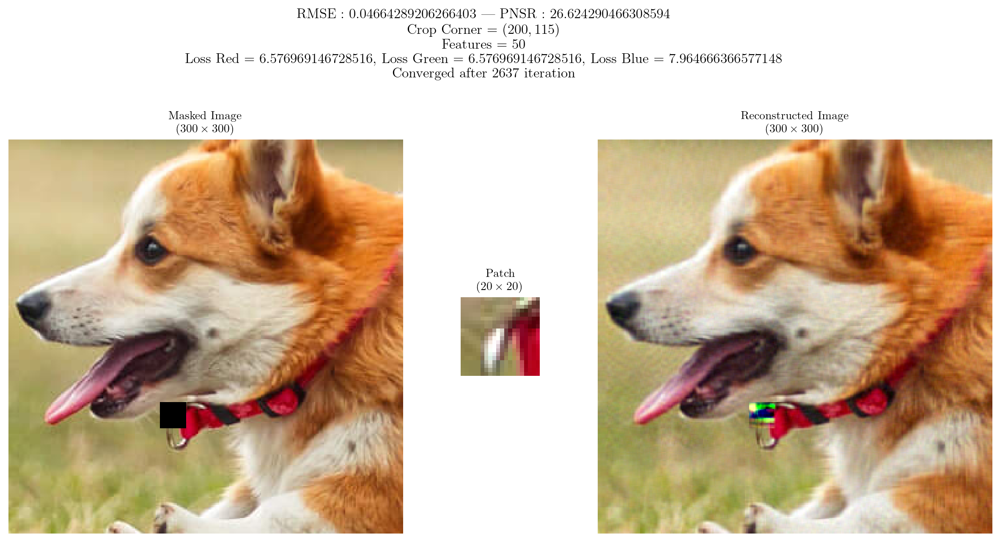

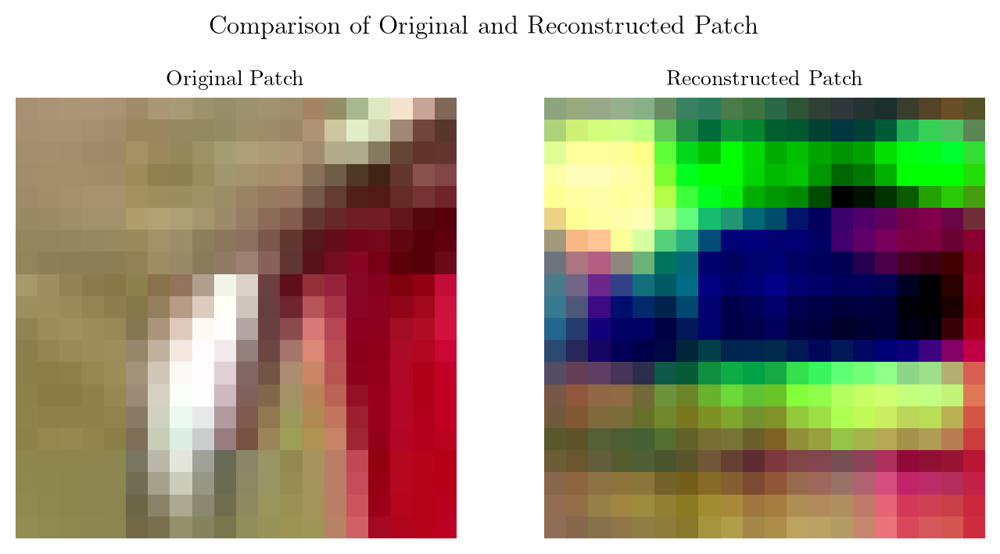

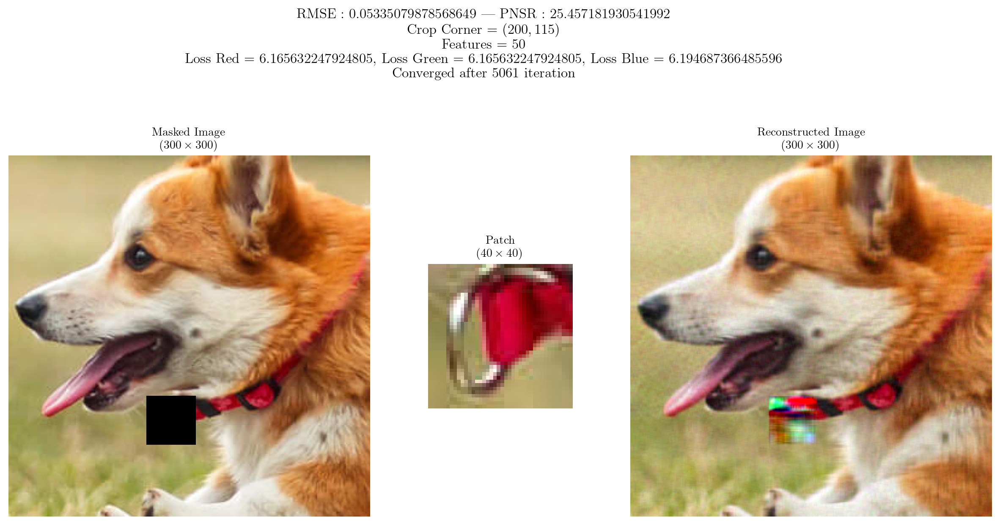

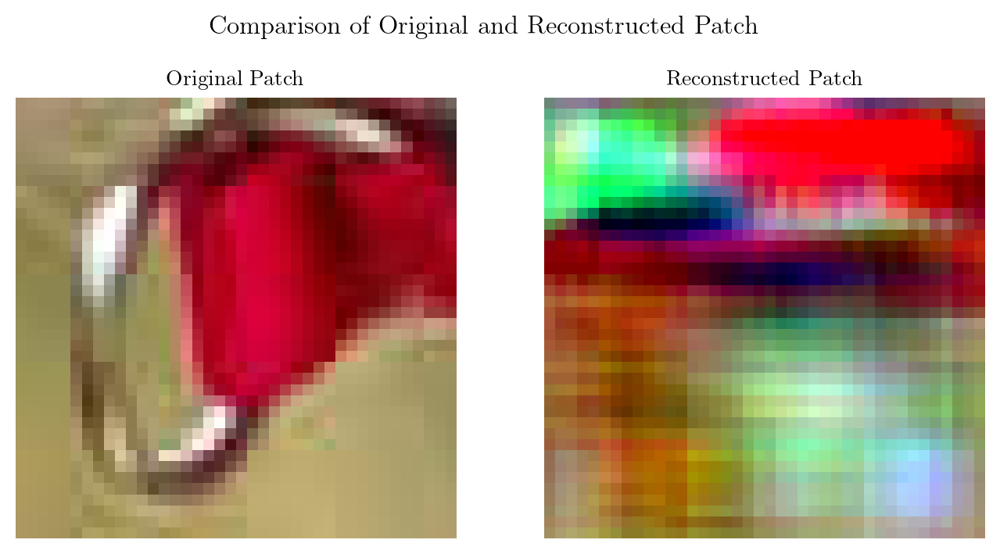

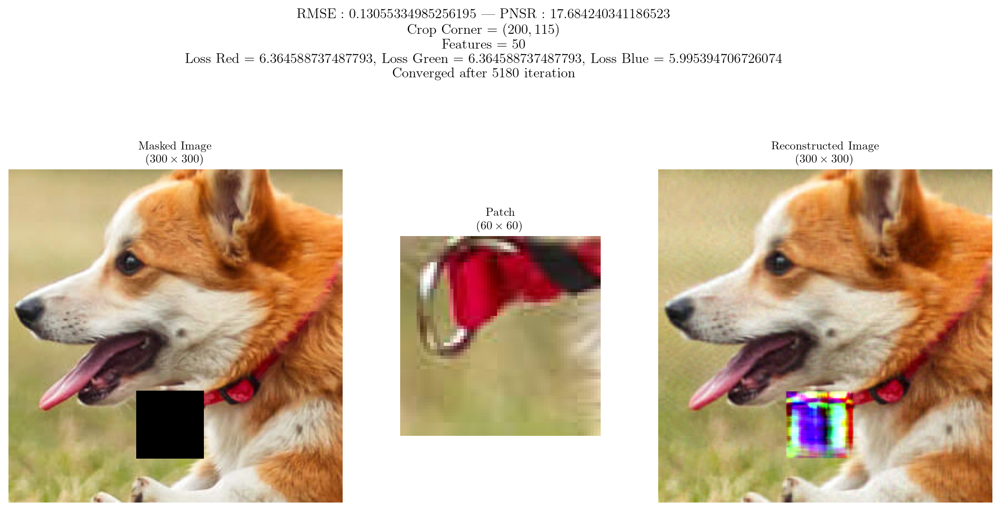

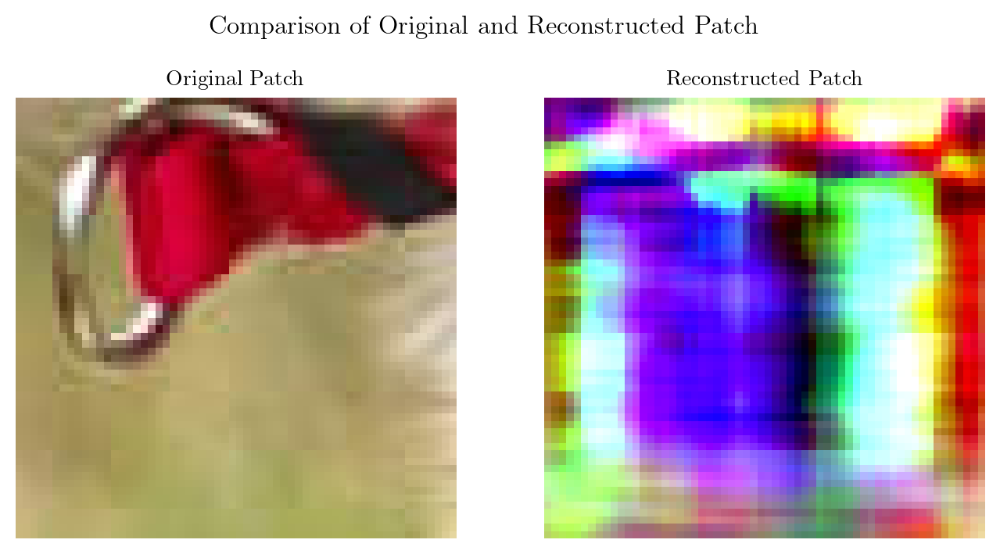

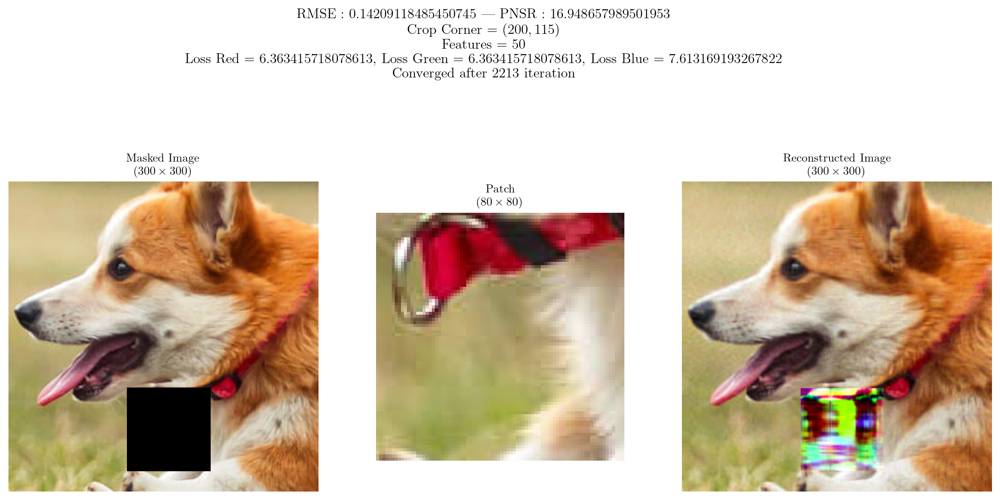

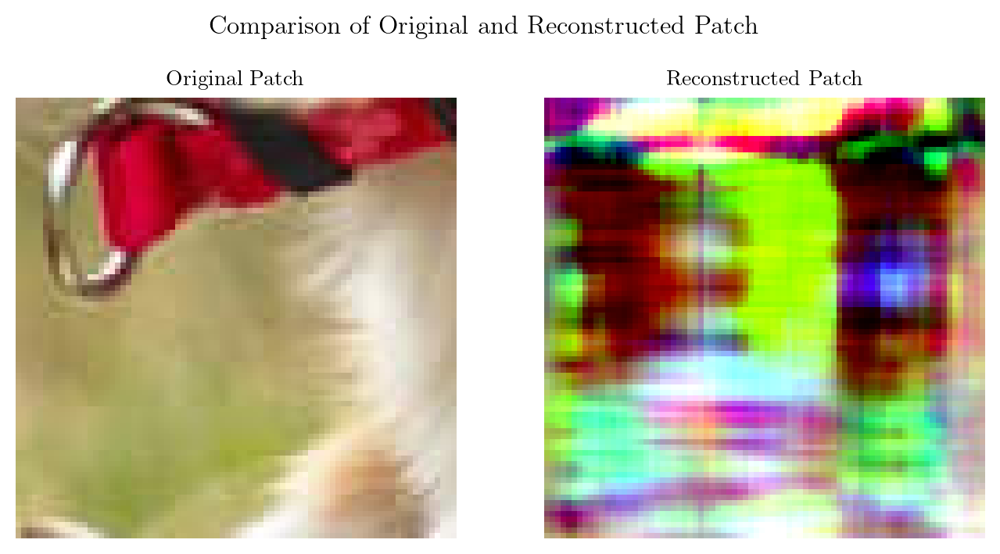

In [18]:
features = 50
rmses, psnrs = [], []
patches = [20, 40, 60, 80]
for i, patch_size in enumerate(patches):
    rmse, psnr = train_reconstruct_plot_patch(img_scaled, (200, 115), patch_size, features, 1e-6, device, allowSave = True, FileName = f"./Patch{patch_size}.png", allowMetrics = True)
    rmses.append(rmse)
    psnrs.append(psnr)

### **$N^2$ POINTS SUBSET REMOVED**

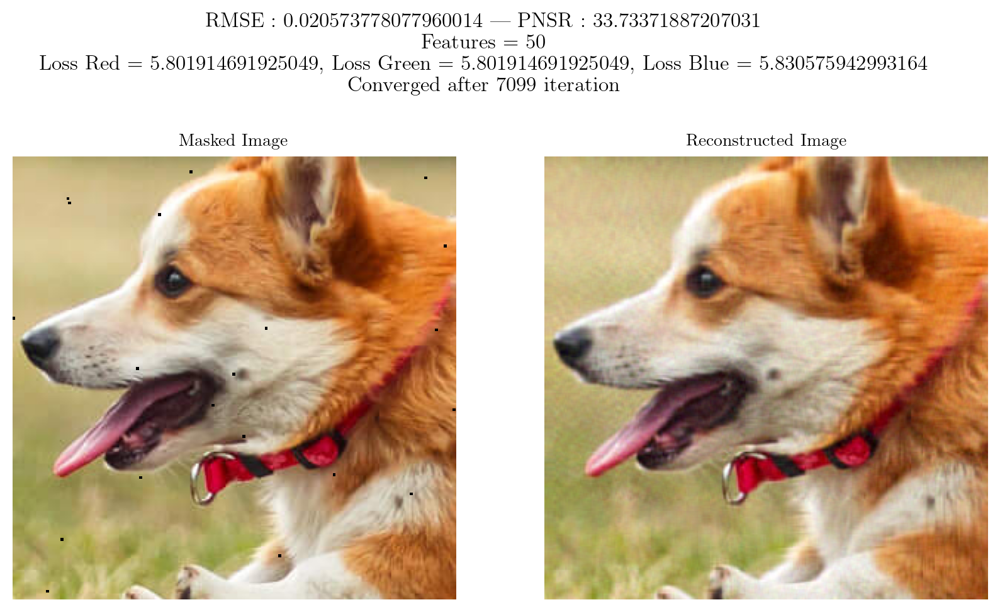

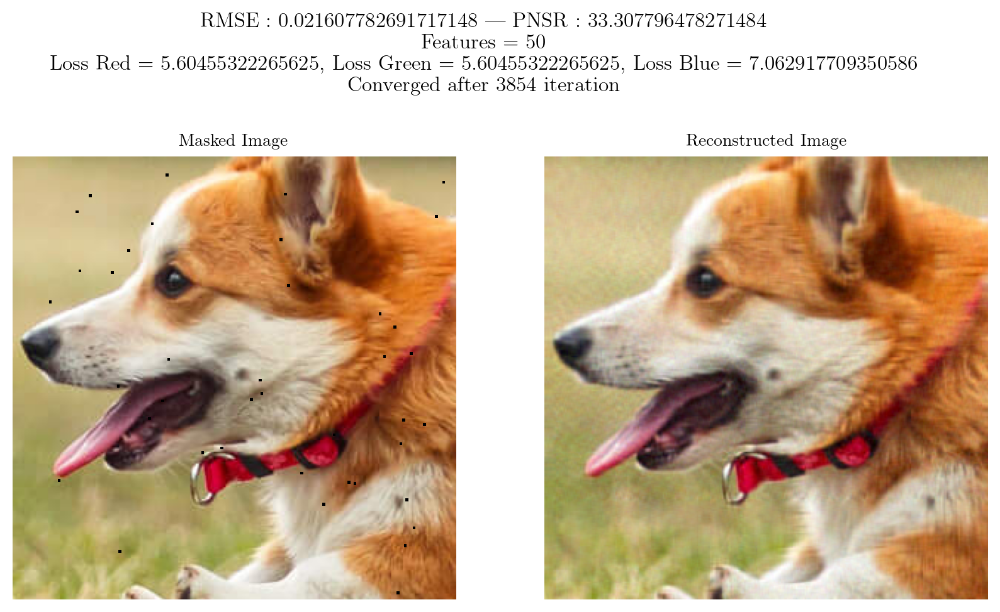

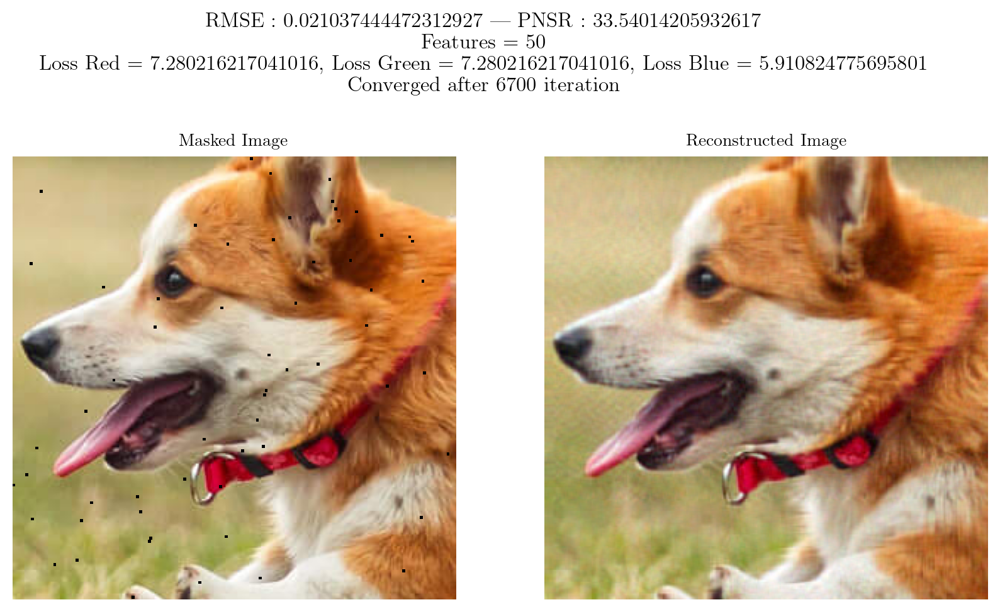

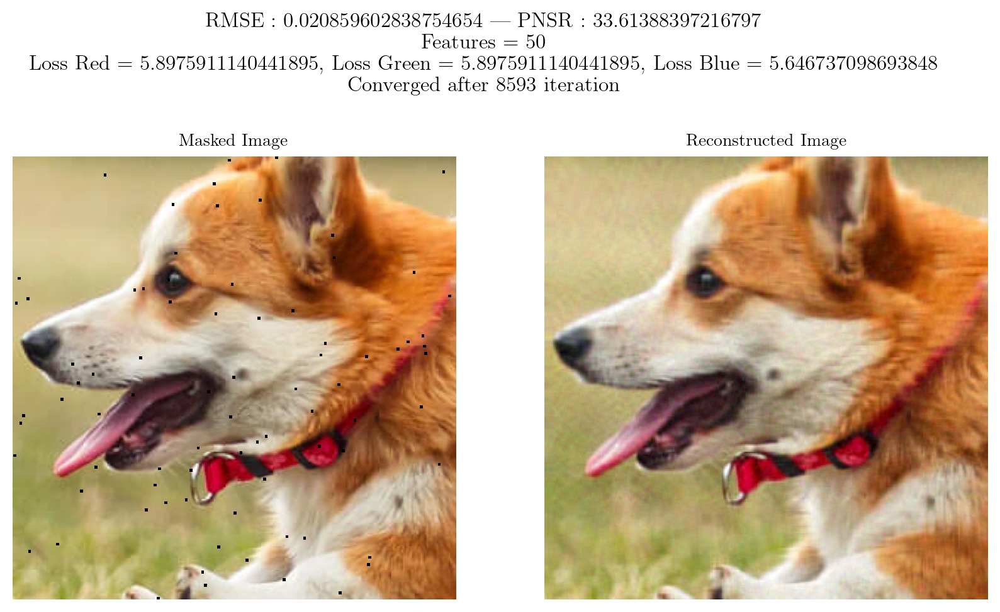

In [19]:
features = 50
rmses_, psnrs_ = [], []
for i, patch_size in enumerate(patches):
    rmse, psnr = train_reconstruct_plot_subset(img_scaled, patch_size, features, 1e-6, device, allowSave = True, FileName = f"./Subset{patch_size}.png", allowMetrics = True)
    rmses_.append(rmse)
    psnrs_.append(psnr)

### **PLOTS FOR COMPARSION**

In [20]:
rm = [x.detach().cpu().numpy() for x in rmses]
rm_ = [x.detach().cpu().numpy() for x in rmses_]

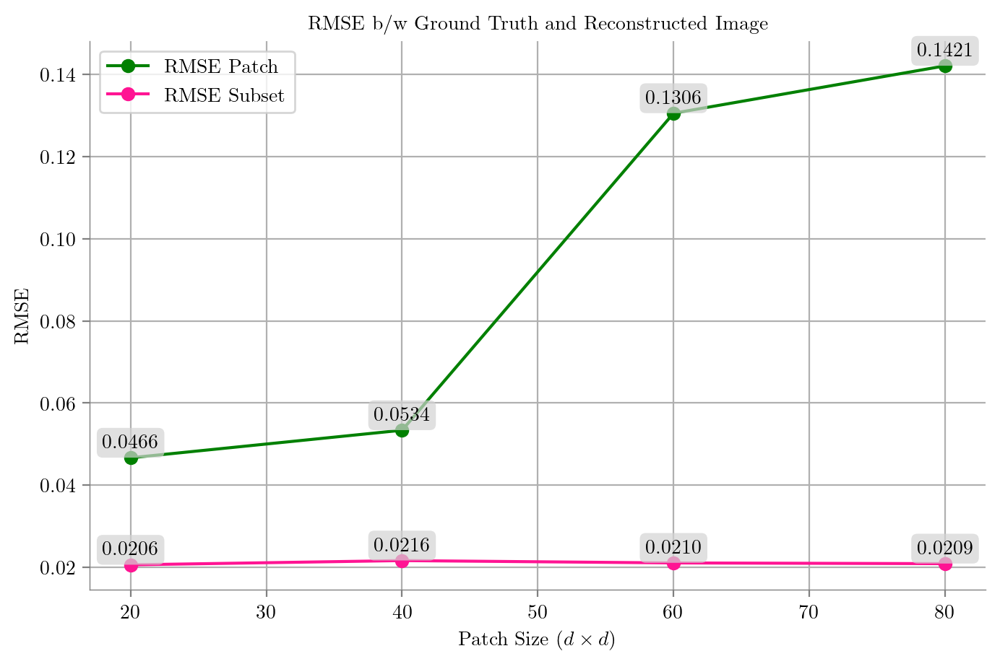

In [22]:
latexify(columns = 2, fig_width = 8)
plt.plot(patches, rm, marker = "o", label = "RMSE Patch", color = "green")
plt.plot(patches, rm_, marker = "o", label = "RMSE Subset", color = "deeppink")
plt.xlabel(r"Patch Size $(d \times d)$")
plt.ylabel("RMSE")
plt.title("RMSE b/w Ground Truth and Reconstructed Image")
plt.grid()
plt.legend()
format_axes(plt.gca())
for i, psnr in enumerate(rm):
    plt.annotate(f'{psnr:.4f}', (patches[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))

for i, psnr in enumerate(rm_):
    plt.annotate(f'{psnr:.4f}', (patches[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))
plt.show()

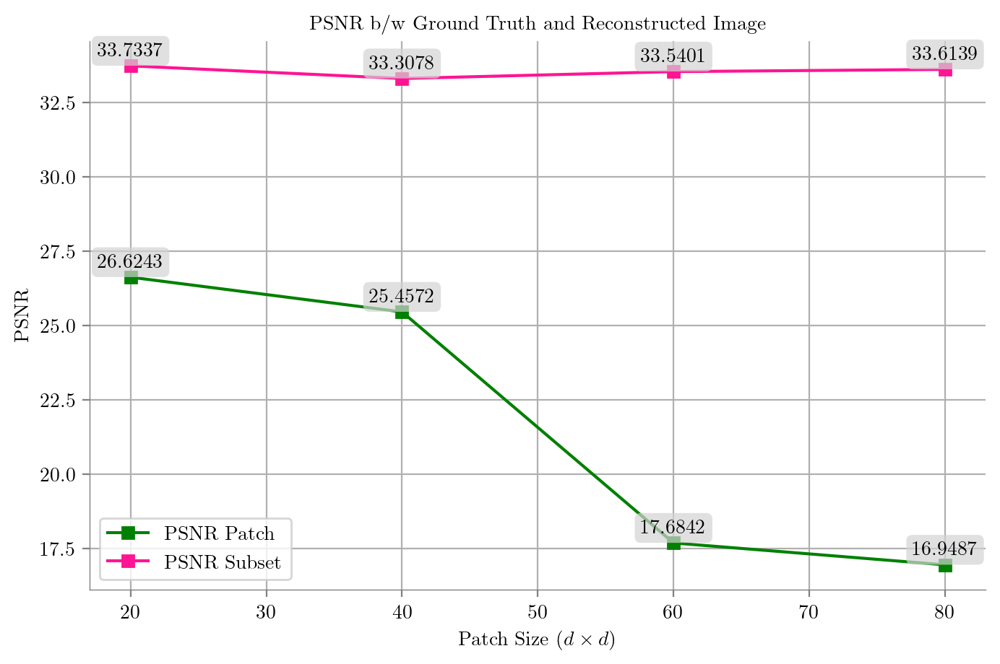

In [23]:
latexify(columns = 2, fig_width = 8)
plt.plot(patches, psnrs, marker = "s", label = "PSNR Patch", color = "green")
plt.plot(patches, psnrs_, marker = "s", label = "PSNR Subset", color = "deeppink")
plt.xlabel(r"Patch Size $(d \times d)$")
plt.ylabel("PSNR")
plt.title("PSNR b/w Ground Truth and Reconstructed Image")
plt.grid()
plt.legend()
format_axes(plt.gca())
for i, psnr in enumerate(psnrs):
    plt.annotate(f'{psnr:.4f}', (patches[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))
for i, psnr in enumerate(psnrs_):
    plt.annotate(f'{psnr:.4f}', (patches[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))
plt.show()